In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

In [2]:
%load_ext autoreload
%autoreload 2

In [210]:
import sys

src_dir = '../../src/'
if src_dir not in sys.path:
    sys.path.append(src_dir)

from metrics import calculate_conf, calculate_conf_all_samples

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from PIL import Image

from icevision.all import *

In [4]:
DATA_DIR = '../../../data'

In [5]:
df = pd.read_csv(f'{DATA_DIR}/train.csv')

# Process the annotations column
df['annotations'] = df['annotations'].map(eval)
df['num_annotations'] = df['annotations'].map(len)

In [6]:
width, height = [], []

for o in df.itertuples():
    video_id = o.video_id
    video_frame = o.video_frame
    
    img = Image.open(f'{DATA_DIR}/train_images/video_{video_id}/{video_frame}.jpg')
    img_width, img_height = img.size
    
    width.append(img_width)
    height.append(img_height)
    
    img.close()

In [7]:
df['img_width'] = width
df['img_height'] = height

In [8]:
df.head()

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,num_annotations,img_width,img_height
0,0,40258,0,0,0-0,[],0,1280,720
1,0,40258,1,1,0-1,[],0,1280,720
2,0,40258,2,2,0-2,[],0,1280,720
3,0,40258,3,3,0-3,[],0,1280,720
4,0,40258,4,4,0-4,[],0,1280,720


In [9]:
print(f"Negative image examples: {df[df['num_annotations'] == 0].shape[0]}")
print(f"Positive image examples: {df[df['num_annotations'] != 0].shape[0]}")

Negative image examples: 18582
Positive image examples: 4919


In [10]:
dfexp = df.explode('annotations')

Let's create a balanced array with positive and negative image examples. The sequences also have quite varied numbers of +/- examples. We will need to figure out how to deal with this eventually.

In [80]:
negative_examples_frac = 1.0
positive_examples = int(df[df['num_annotations'] != 0].shape[0] * negative_examples_frac)
negative_random_state = 42

data = pd.concat([dfexp[~dfexp['annotations'].isnull()],
                  dfexp[dfexp['annotations'].isnull()].sample(n=positive_examples, replace=False, random_state=negative_random_state)]).copy(deep=True)

# Shuffle the data, just because
sample_frac = 1.0
data = data.sample(frac=sample_frac, replace=False).reset_index(drop=True)

In [81]:
data.head()

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,num_annotations,img_width,img_height
0,0,8399,4079,341,0-4079,NaN,0,1280,720
1,0,45015,5816,114,0-5816,NaN,0,1280,720
2,2,22643,5825,462,2-5825,"{'x': 182, 'y': 499, 'width': 89, 'height': 77}",8,1280,720
3,0,8399,4591,853,0-4591,"{'x': 153, 'y': 60, 'width': 65, 'height': 34}",4,1280,720
4,2,22643,5897,534,2-5897,"{'x': 590, 'y': 405, 'width': 38, 'height': 36}",6,1280,720


In [82]:
def extract_bb(annot):
    output = {}
    # Extract BB if it's not a negative example
    if not pd.isnull(annot):
        output['xmin'] = annot['x']
        output['ymin'] = annot['y']
        output['bb_width'] = annot['width']
        output['bb_height'] = annot['height']
        
    # otherwise set default values
    else:
        output['xmin'] = -1
        output['ymin'] = -1
        output['bb_width'] = -1
        output['bb_height'] = -1
    
    return output

In [83]:
data['annotations'] = data['annotations'].map(extract_bb)

data['xmin'] = data['annotations'].map(lambda x: x['xmin'])
data['ymin'] = data['annotations'].map(lambda x: x['ymin'])
data['bb_width'] = data['annotations'].map(lambda x: x['bb_width'])
data['bb_height'] = data['annotations'].map(lambda x: x['bb_height'])

In [84]:
data.head()

,video_id,sequence,video_frame,sequence_frame,image_id,...,img_height,xmin,ymin,bb_width,bb_height
0,0,8399,4079,341,0-4079,...,720,-1,-1,-1,-1
1,0,45015,5816,114,0-5816,...,720,-1,-1,-1,-1
2,2,22643,5825,462,2-5825,...,720,182,499,89,77
3,0,8399,4591,853,0-4591,...,720,153,60,65,34
4,2,22643,5897,534,2-5897,...,720,590,405,38,36


In [85]:
class ReefParser(Parser):
    def __init__(self, 
                 template_record, 
                 data_dir, 
                 annotations_csv):
        super().__init__(template_record=template_record)

        self.data_dir = data_dir
        
        # Ensure columns are in correct order so we can use name=None in itertuples -> faster
        self.df = annotations_csv
        
        self.class_map = ClassMap(['starfish'])

    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o

    def __len__(self) -> int:
        return len(self.df)
    
    def record_id(self, o) -> Hashable:
        return str(o.video_id) + '_' + str(o.video_frame) # need a distinct id for each image

    def parse_fields(self, o, record, is_new):
        
        if is_new:
            record.set_filepath(os.path.join(self.data_dir, f'video_{o.video_id}', f'{o.video_frame}.jpg'))
            record.set_img_size(ImgSize(width=o.img_width, height=o.img_height))
            record.detection.set_class_map(self.class_map)
        
        if not ((o.xmin == -1) and (o.ymin == -1) and (o.bb_width == -1) and (o.bb_height == -1)):
            xmin, ymin, bb_width, bb_height = o.xmin, o.ymin, o.bb_width, o.bb_height
            xmax = xmin + bb_width
            ymax = ymin + bb_height

#             record.detection.add_bboxes([BBox.from_xywh(xmin, ymin, bb_width, bb_height)])
            record.detection.add_bboxes([BBox.from_xyxy(xmin, ymin, xmax, ymax)])
            record.detection.add_labels(['starfish'])

In [86]:
template_record = ObjectDetectionRecord()

In [87]:
parser = ReefParser(template_record, f'{DATA_DIR}/train_images', data)
train_records, valid_records = parser.parse(RandomSplitter((0.8, 0.2)))

  0%|          | 0/16817 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/9838 [00:00<?, ?it/s]

AUTOFIX-SUCCESS - (record_id: 1_9105) - Clipping bbox ymax from 729 to image height 720 (Before: <BBox (xmin:206, ymin:690, xmax:248, ymax:729)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 1_5498) - Clipping bbox ymax from 721 to image height 720 (Before: <BBox (xmin:374, ymin:671, xmax:433, ymax:721)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 2_5780) - Clipping bbox ymax from 721 to image height 720 (Before: <BBox (xmin:725, ymin:657, xmax:803, ymax:721)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 1_9289) - Clipping bbox ymax from 722 to image height 720 (Before: <BBox (xmin:192, ymin:679, xmax:257, ymax:722)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 1_6273) - Clipping bbox ymax from 742 to image height 720 (Before: <BBox (xmin:640, ymin:674, xmax:716, ymax:742)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 1_4157) - 

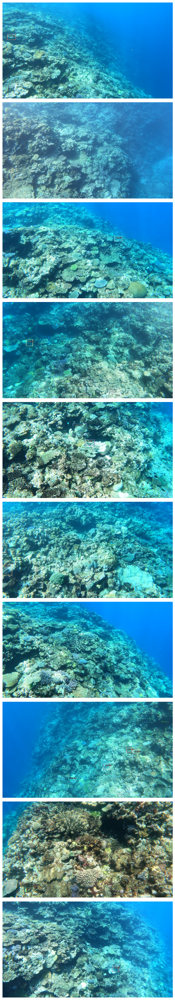

In [88]:
show_records(train_records[:10], display_label=True, display_bbox=True, figsize=(30,40))

### Model training

In [89]:
presize = 720
size = 832

In [90]:
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=size, 
                                              presize=presize),
                             tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size=size), tfms.A.Normalize()])

train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

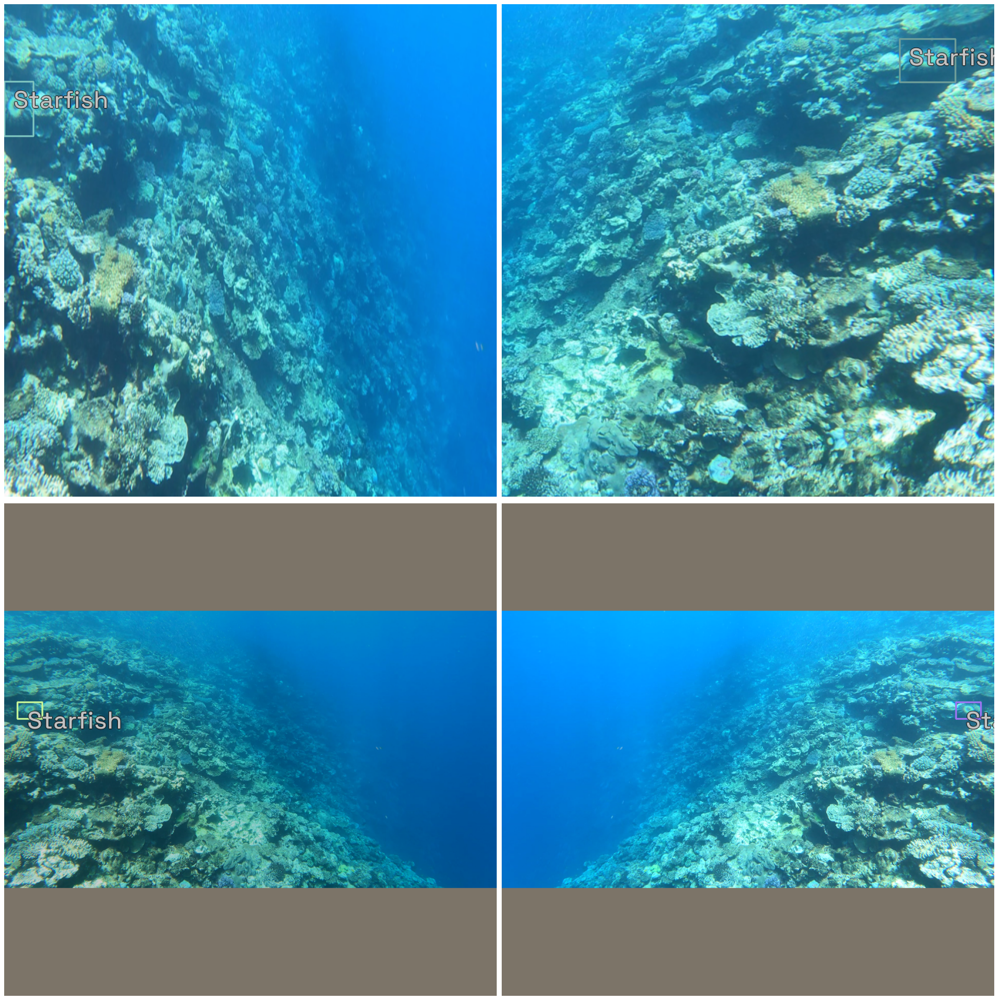

In [102]:
samples = [train_ds[0] for _ in range(4)]
show_samples(samples, ncols=2)

In [91]:
# model_type = models.torchvision.retinanet
# backbone = model_type.backbones.resnet34_fpn

# model = model_type.model(backbone=backbone(pretrained=True), 
#                          num_classes=len(parser.class_map))

model_type = models.ultralytics.yolov5
backbone = model_type.backbones.large_p6

model = model_type.model(backbone=backbone(pretrained=True), 
                         num_classes=len(parser.class_map),
                         img_size=size)

train_dl = model_type.train_dl(train_ds, batch_size=3, num_workers=4, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=3, num_workers=4, shuffle=False)

metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)

SuggestedLRs(valley=0.02290867641568184)

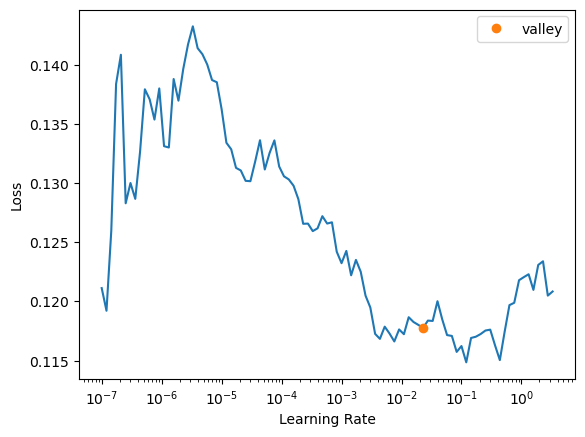

In [26]:
learn.freeze()
# learn.lr_find(end_lr=4e-3, stop_div=False)
learn.lr_find()

### yolov5

negative_examples_frac = 1.0
sample_frac = 1.0
size=size, 
presize=presize, 
shift_scale_rotate=None,
blur=None,
lightning=None,
rgb_shift=None)

In [92]:
learn.fine_tune(10, 1.0e-3, freeze_epochs=1)

epoch,train_loss,valid_loss,COCOMetric,time
0,0.068998,0.059524,0.000062,08:20


epoch,train_loss,valid_loss,COCOMetric,time
0,0.049500,0.037595,0.029811,11:32
1,0.044346,0.031775,0.146196,11:30
2,0.047739,0.029338,0.223135,11:33
3,0.038000,0.027684,0.283184,11:31
4,0.038811,0.025237,0.329481,11:33
5,0.034036,0.024598,0.346803,11:32
6,0.037222,0.022727,0.386574,11:34
7,0.033237,0.021527,0.424199,11:34
8,0.029619,0.020858,0.435000,11:32
9,0.028182,0.020697,0.439926,11:33


In [93]:
# Save trained weights in a local folder
torch.save(model.state_dict(), 
           f'../../../models/yolov5_large_p6_lr_1.0e-3_80pct_1.0_samplefrac_1_10_epochs.pth')

### yolov5

negative_examples_frac = 1.0
sample_frac = 0.3
size=size, 
presize=presize, 
shift_scale_rotate=None,
blur=None,
lightning=None,
rgb_shift=None)

In [78]:
learn.fine_tune(10, 1.0e-3, freeze_epochs=1)

epoch,train_loss,valid_loss,COCOMetric,time
0,0.083205,0.065887,0.000009,03:10


epoch,train_loss,valid_loss,COCOMetric,time
0,0.069626,0.049475,0.000441,04:23
1,0.054106,0.041946,0.008908,04:25
2,0.052049,0.036138,0.045043,04:25
3,0.051555,0.034643,0.049570,04:26
4,0.046061,0.034257,0.060956,04:26
5,0.048303,0.030533,0.082641,04:25
6,0.047299,0.029531,0.090333,04:26
7,0.042032,0.027680,0.099607,04:26
8,0.037860,0.027172,0.104472,04:26
9,0.035325,0.026962,0.106050,04:26


In [79]:
# Save trained weights in a local folder
torch.save(model.state_dict(), 
           f'../../../models/yolov5_large_p6_lr_1.0e-3_80pct_0.3_samplefrac_1_10_epochs.pth')

### yolov5

negative_examples_frac = 1.0
sample_frac = 0.2
size=size, 
presize=presize, 
shift_scale_rotate=None,
blur=None,
lightning=None,
rgb_shift=None)

In [64]:
learn.fine_tune(10, 1.0e-3, freeze_epochs=1)

epoch,train_loss,valid_loss,COCOMetric,time
0,0.087289,0.069049,0.000003,02:17


epoch,train_loss,valid_loss,COCOMetric,time
0,0.076141,0.056524,0.000089,03:08
1,0.063318,0.046233,0.006339,03:08
2,0.058934,0.041634,0.022348,03:08
3,0.050428,0.038346,0.043111,03:09
4,0.052510,0.036961,0.055632,03:09
5,0.048535,0.036104,0.057215,03:08
6,0.044453,0.033639,0.076566,03:08
7,0.041268,0.032546,0.085833,03:08
8,0.041412,0.032296,0.081044,03:08
9,0.040402,0.031972,0.084529,03:08


### yolov5

negative_examples_frac = 0.5
sample_frac = 0.1
size=size, 
presize=presize, 
shift_scale_rotate=None,
blur=None,
lightning=None,
rgb_shift=None)

In [50]:
learn.fine_tune(10, 1.0e-3, freeze_epochs=1)

epoch,train_loss,valid_loss,COCOMetric,time
0,0.105290,0.074255,0.000000,01:02


epoch,train_loss,valid_loss,COCOMetric,time
0,0.088018,0.066165,0.000036,01:23
1,0.078746,0.054663,0.000151,01:24
2,0.074015,0.046808,0.007761,01:24
3,0.071732,0.042926,0.012907,01:23
4,0.058714,0.043698,0.020722,01:24
5,0.059780,0.040483,0.029981,01:24
6,0.054205,0.037830,0.035672,01:23
7,0.054411,0.037251,0.043398,01:24
8,0.050590,0.036182,0.040375,01:24
9,0.051390,0.036028,0.042945,01:24


### yolov5

negative_examples_frac = 1.0
sample_frac = 0.1
size=size, 
presize=presize, 
shift_scale_rotate=None,
blur=None,
lightning=None,
rgb_shift=None)

In [36]:
learn.fine_tune(10, 1.0e-3, freeze_epochs=1)

epoch,train_loss,valid_loss,COCOMetric,time
0,0.086184,0.065121,0.000001,01:14


epoch,train_loss,valid_loss,COCOMetric,time
0,0.086529,0.057527,0.000007,01:42
1,0.071247,0.047437,0.000414,01:43
2,0.064414,0.041745,0.006432,01:43
3,0.056062,0.036647,0.014850,01:43
4,0.052406,0.035696,0.021799,01:43
5,0.050787,0.034865,0.037894,01:43
6,0.051081,0.032453,0.039033,01:43
7,0.041415,0.031983,0.045345,01:43
8,0.042871,0.031265,0.050864,01:42
9,0.042016,0.031150,0.050019,01:42


### yolov5

negative_examples_frac = 1.0
sample_frac = 0.1
scale_shift_rotate=None

In [33]:
learn.fine_tune(10, 1.0e-3, freeze_epochs=1)

epoch,train_loss,valid_loss,COCOMetric,time
0,0.090977,0.069209,0.000000,01:13


epoch,train_loss,valid_loss,COCOMetric,time
0,0.081132,0.058361,0.000010,01:40
1,0.071829,0.047362,0.000864,01:41
2,0.066341,0.040609,0.009505,01:42
3,0.061406,0.038076,0.012843,01:42
4,0.060402,0.034500,0.042317,01:42
5,0.051790,0.033027,0.034454,01:42
6,0.044807,0.032319,0.040611,01:43
7,0.044008,0.031468,0.044377,01:42
8,0.045811,0.030814,0.044775,01:43
9,0.047302,0.030648,0.048811,01:43


### yolov5

all transforms enabled

In [27]:
learn.fine_tune(10, 1.0e-3, freeze_epochs=1)

epoch,train_loss,valid_loss,COCOMetric,time
0,0.094067,0.065414,0.000000,01:14


epoch,train_loss,valid_loss,COCOMetric,time
0,0.084234,0.057081,0.000017,01:42
1,0.069587,0.047237,0.000451,01:41
2,0.068158,0.041947,0.002700,01:42
3,0.058474,0.039302,0.015569,01:42
4,0.055835,0.034526,0.042226,01:42
5,0.055451,0.035091,0.035220,01:42
6,0.049123,0.034811,0.041730,01:43
7,0.050440,0.033069,0.047811,01:43
8,0.044289,0.032620,0.046782,01:43
9,0.045468,0.031866,0.050730,01:43


In [28]:
learn.fine_tune(10, 1.0e-3, freeze_epochs=0)

epoch,train_loss,valid_loss,COCOMetric,time
0,0.046944,0.032720,0.048563,01:40
1,0.046999,0.033202,0.053447,01:41
2,0.050770,0.033381,0.047828,01:42
3,0.053551,0.034565,0.038029,01:42
4,0.054296,0.032191,0.053089,01:42
5,0.048806,0.033221,0.047760,01:42
6,0.050188,0.031281,0.061905,01:42
7,0.047879,0.031244,0.057223,01:42
8,0.041659,0.029910,0.064292,01:42
9,0.041658,0.029940,0.064977,01:42


In [29]:
learn.fine_tune(10, 1.0e-3, freeze_epochs=0)

epoch,train_loss,valid_loss,COCOMetric,time
0,0.042898,0.029958,0.056325,01:40
1,0.047480,0.030892,0.053841,01:41
2,0.050624,0.030902,0.059002,01:42
3,0.046738,0.030803,0.068852,01:41
4,0.044803,0.031924,0.052806,01:42
5,0.039551,0.029573,0.058174,01:42
6,0.043099,0.030167,0.065645,01:42
7,0.040068,0.029085,0.059630,01:41
8,0.039241,0.028743,0.062057,01:42
9,0.040364,0.028599,0.060195,01:42


### Work on using metric

In [104]:
# # Batch Inference
# infer_dl = model_type.infer_dl(valid_ds, batch_size=3, shuffle=False)
# # preds = model_type.predict_from_dl(model, infer_dl, keep_images=False)
# preds = model_type.predict_from_dl(model, infer_dl, keep_images=True)

  0%|          | 0/656 [00:00<?, ?it/s]

In [198]:
%%time

### Get predictions from the trained model
detection_threshold = 0.1
preds = []

# Make prediction in the original image coordinates
# Note: iterating through valid_ds.records is siginificantly
# faster than iterating through valid_ds
for entry in tqdm(valid_ds.records):
    img = Image.open(entry.filepath)
    
    pred = model_type.end2end_detect(img, 
                                     valid_tfms, 
                                     model, 
                                     class_map=parser.class_map, 
                                     detection_threshold=detection_threshold)
    preds.append(pred)
    
    img.close()

  0%|          | 0/1968 [00:00<?, ?it/s]

CPU times: user 34min 29s, sys: 36.7 s, total: 35min 6s
Wall time: 2min 57s


In [191]:
### Extract the relevant parameters from predictions

bboxes = []
scores = []

for pred in preds:
    bboxes.append(np.array([bb.xyxy for bb in pred['detection']['bboxes']]))
    scores.append(pred['detection']['scores'])

In [193]:
### Get the ground truth boxes

gts = []

for record in valid_ds.records:
    gts.append(np.array([bb.xyxy for bb in record.detection.bboxes]))

In [194]:
total_tps = 0
total_fps = 0
total_fns = 0

for i, _ in enumerate(gts):
    
    # If the image has no bboxes, and we predicted no bboxes, no accumulation
    if (len(gts[i]) == 0) and (len(bboxes[i]) == 0):
        tps, fps, fns = 0, 0, 0
        
    # If the image has no bboxes, and we predicted bboxes, all are false positives
    elif (len(gts[i]) == 0) and (len(bboxes[i]) != 0):
        tps, fps, fns = 0, len(bboxes[i]), 0
        
    # If the image has bboxes, and we predicted no bboxes, all are false negatives
    elif (len(gts[i]) != 0) and (len(bboxes[i]) == 0):
        tps, fps, fns = 0, 0, len(gts[i])
        
    # Otherwise let's do the full calculation
    else:
        tps, fps, fns = calculate_conf(gts[i], bboxes[i], scores[i])
        
    total_tps += tps
    total_fps += fps
    total_fns += fns

In [195]:
precision = total_tps / (total_tps + total_fps)
recall = total_tps / (total_tps + total_fps)

beta = 2
# f2 = (1 + beta**2) * precision * recall / (beta**2 * precision + recall)
f2 = 5 * precision * recall / (4 * precision + recall)

Threshold = 0.3

In [189]:
f2

0.761572217241542

Threshold = 0.4

In [196]:
f2

0.8186173108328797

Threshold = 0.5

In [182]:
f2

0.8522988505747127

Threshold = 0.6

#### Compute across all thresholds

In [198]:
%%time

### Get predictions from the trained model
detection_threshold = 0.1
preds = []

# Make prediction in the original image coordinates
# Note: iterating through valid_ds.records is siginificantly
# faster than iterating through valid_ds
for entry in tqdm(valid_ds.records):
    img = Image.open(entry.filepath)
    
    pred = model_type.end2end_detect(img, 
                                     valid_tfms, 
                                     model, 
                                     class_map=parser.class_map, 
                                     detection_threshold=detection_threshold)
    preds.append(pred)
    
    img.close()

  0%|          | 0/1968 [00:00<?, ?it/s]

CPU times: user 34min 29s, sys: 36.7 s, total: 35min 6s
Wall time: 2min 57s


In [208]:
thrs = np.arange(0.1, 0.95, 0.05)
f2s = []

for thr in thrs:
    # thr = 0.5

    ### Extract the relevant parameters from predictions
    bboxes = []
    scores = []

    for pred in preds:
        current_bboxes = pred['detection']['bboxes']
        current_scores = pred['detection']['scores']

        # Filter based on current threshold value thr
        output_bboxes, output_scores = [], []
        for i, _ in enumerate(current_bboxes):
            if current_scores[i] > thr:
                output_bboxes.append(current_bboxes[i].xyxy)
                output_scores.append(current_scores[i])

        bboxes.append(np.array(output_bboxes))
        scores.append(np.array(output_scores))

    ### Get the ground truth boxes

    gts = []

    for record in valid_ds.records:
        gts.append(np.array([bb.xyxy for bb in record.detection.bboxes]))

    # Calculate dataset-wide tps, fps, fns
    total_tps, total_fps, total_fns = calculate_conf_all_samples(gts, bboxes, scores)

    # Compute precision, recall, F2
    precision = total_tps / (total_tps + total_fps)
    recall = total_tps / (total_tps + total_fns)
    f2 = 5 * precision * recall / (4 * precision + recall)
    
    f2s.append(f2)

In [209]:
print(f2s)

[0.703918245701179, 0.7184524320150981, 0.7163149018387831, 0.7157856411038012, 0.7030535348695387, 0.6956937286182595, 0.6850276051821212, 0.670004993357892, 0.6483406520809855, 0.6276609534065188, 0.6025721128813912, 0.5633856634424331, 0.5138415970894165, 0.4318568764694755, 0.3202571316642331, 0.14144294226949447, 0.010363670623704541]


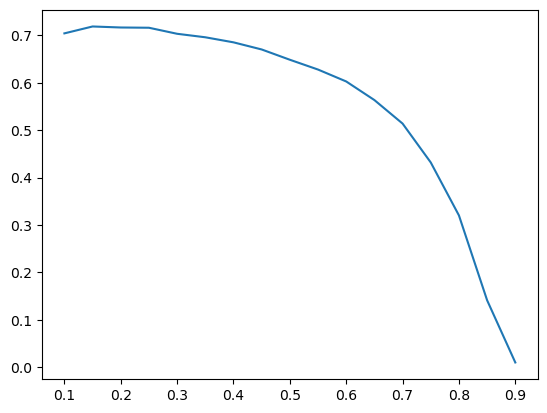

In [211]:
plt.plot(thrs, f2s)

## RetinaNet - ResNet 34

Batch size = 16

In [27]:
learn.fine_tune(10, 2.0e-4, freeze_epochs=1)

epoch,train_loss,valid_loss,COCOMetric,time
0,1.182167,1.039327,0.000000,00:47


epoch,train_loss,valid_loss,COCOMetric,time
0,1.078734,0.986468,0.000004,01:08
1,1.052654,0.975649,0.000019,01:08
2,1.056529,0.994541,0.000011,01:07
3,1.045828,0.968771,0.000138,01:07
4,0.979087,0.941842,0.000366,01:08
5,0.941669,0.938826,0.000247,01:08
6,0.926925,0.891751,0.001790,01:07
7,0.897821,0.893880,0.004312,01:08
8,0.865124,0.886787,0.002686,01:07
9,0.850360,0.882026,0.002246,01:08
